# Лабораторная работа №1

## Поиск мостов в графах

#### Выполнили

- Антон Исаев
- Александр Ляшук

### Лабораторная работа состоит из двух частей

1. Реализация поиска мостов на C++
2. Визуализация полученных результатов на Python

## 1. Реализация поиска мостов на C++

Для запуска кода, выполняющего генерацию графов и поиск мостов на них, необходимо следующее:

- Скомпилировать, используя CMake + gcc
- Запустить скомпилированный бинарный файл со следующими параметрами

`./graph <MAX_NUMBER_OF_GRAPH_VERTICES> <EDGES_PROBABILITY>`, где

- `<MAX_NUMBER_OF_GRAPH_VERTICES>` - максимальнгое количество вершин в графе
- `<EDGES_PROBABILITY>` - вероятность для всех V, U, что (V, U) - ребро

Программа сгенерирует несколько графов разным количеством вершин, начиная **10** и заканчивая `<MAX_NUMBER_OF_GRAPH_VERTICES>` с шагом **10**, то есть `{10, 20, 30, ..., 1000}` если `<MAX_NUMBER_OF_GRAPH_VERTICES>` = **1000** с `<EDGES_PROBABILITY>` для всех V, U, что (V, U) - ребро

Далее, будут найдены мосты на сгенерированных графах, используя следующие методы:

- Детерминированный поиск
- Рандомизированный проход DFS
- Рандомизированный, используя std::sort
- Рандомизированный, используя сортировку вставками
- Рандомизированный, используя поразрядную сортировку

В процессе выполнения программа создаст следующие файлы: 

- `edges_<NUMBER_OF_GRAPH_VERTICES>_<EDGE_GENERATION_PROBABILITY>.csv` - содержит все ребра сгенерированного графа **(\*)**
- `basic_<NUMBER_OF_GRAPH_VERTICES>_<EDGE_GENERATION_PROBABILITY>.csv` - содержит только те ребра из **(\*)**, по которым прошел DFS
- `one_bridges_<NUMBER_OF_GRAPH_VERTICES>_<EDGE_GENERATION_PROBABILITY>.csv` - содержит только те ребра из **(\*)**, которые являются 1-мостами
- `two_bridges_<NUMBER_OF_GRAPH_VERTICES>_<EDGE_GENERATION_PROBABILITY>.csv` - содержит только те ребра из **(\*)**, которые являются 2-мостами
- `result_<EDGE_GENERATION_PROBABILITY>.csv` - время выполнения по каждому из методов (детерминированный поиск, рандомизированный проход DFS, рандомизированный, используя std::sort, рандомизированный, используя сортировку вставками, рандомизированный, используя поразрядную сортировку)

## 2. Визуализация полученных результатов на Python

Для визуализации графов используются `networkx` и `matplotlib`, чтение производится при помощи `pandas`

In [38]:
import pandas as pd
import networkx as nx
import os.path as osp

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from pylab import rcParams
rcParams['figure.figsize'] = 16, 9

%matplotlib inline

def draw_graph_from_file(n, probability, bridge_type='one', path='output/'):
    all_edges_path = osp.join(path, 'edges_{}_{}.csv')
    bridges_path = osp.join(path, '{}_bridges_{}_{}.csv')
    all_edges = pd.read_csv(all_edges_path.format(n, probability), sep=';', header=None).values.tolist()
    try:
        bridges = pd.read_csv(bridges_path.format(bridge_type, n, probability), sep=';', header=None).values.tolist()
    except:
        bridges = []
        
    g = nx.Graph()

    for edge in all_edges:
        if edge in bridges:
            g.add_edge(*edge, color='red')
        else:
            g.add_edge(*edge, color='black')

    colors = [g[u][v]['color'] for u,v in g.edges()]
        
    plt.figure(figsize=(16,9)) 
    nx.draw(g, with_labels=True, edges=all_edges, edge_color=colors)
    plt.legend(handles=[Line2D([0], [0], color='red', label='1-bridges'), Line2D([0], [0], color='black', label='Other edges')])
    plt.title('Number of vertices: {}, Edge probability: {}'. format(n, probability))
    plt.show()
    
    
def visualize(probability, path='output/'):   
    path = osp.join(path, 'result_{}.csv'.format(probability))
    data = pd.read_csv(path, sep=';', names=["detDfsTime", "dfsTime", "stdSortTime", "bucketSortTime", "radixSortTime", "n"])
    data['bucket_sort_all'] = data['dfsTime'] + data['bucketSortTime']
    data['std_sort_all'] = data['dfsTime'] + data['stdSortTime']
    
    plt.figure(figsize=(16,9)) 
    ax = plt.gca()
    data.plot(kind='line',x='n',y='detDfsTime',color='red', ax=ax)
    data.plot(kind='line',x='n',y='dfsTime',color='black', ax=ax)
    data.plot(kind='line',x='n',y='stdSortTime',color='green', ax=ax)
    data.plot(kind='line',x='n',y='bucketSortTime',color='blue', ax=ax)
    data.plot(kind='line',x='n',y='radixSortTime',color='orange', ax=ax)
    plt.title('Edge probability: {}'. format(probability))
    plt.show()

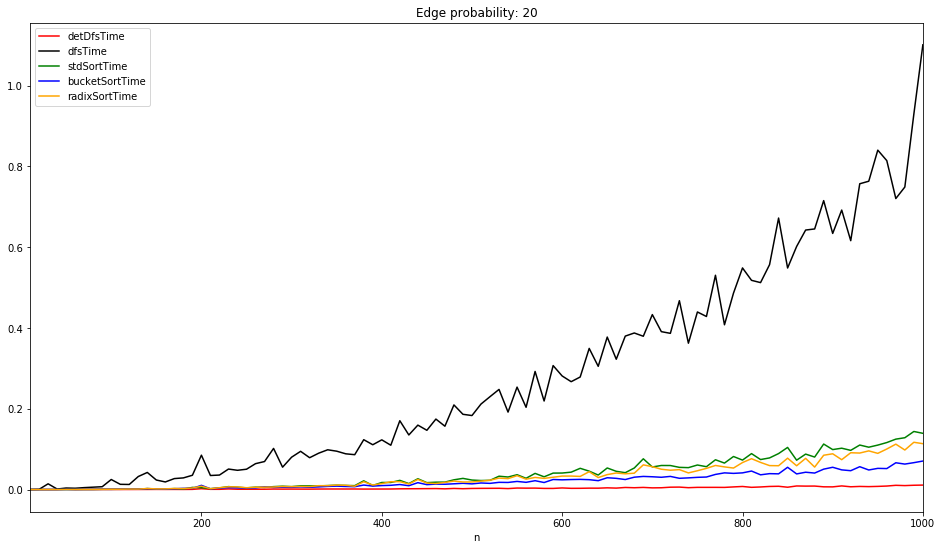

In [39]:
visualize(20)

# Визуализация 1-мостов на различных графах

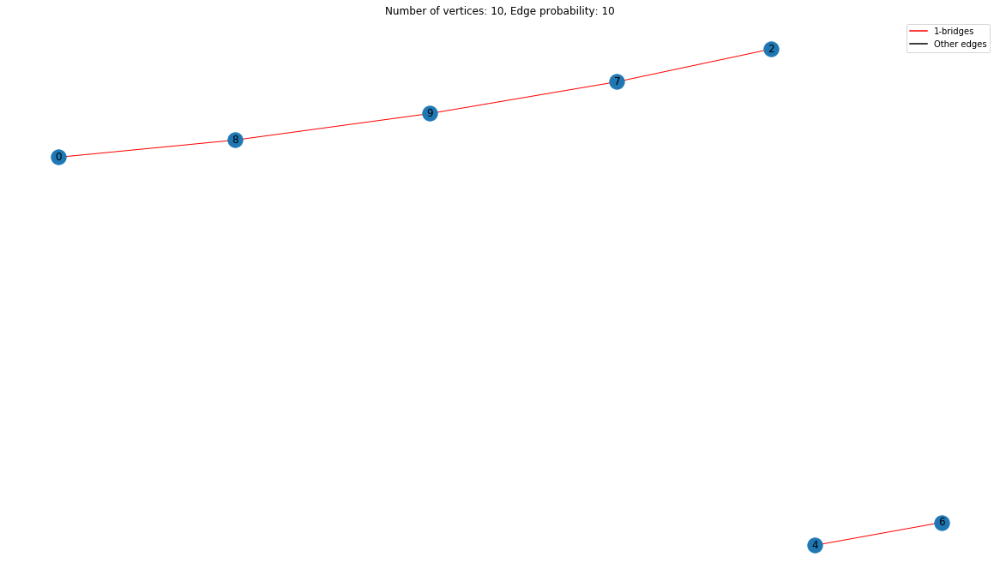

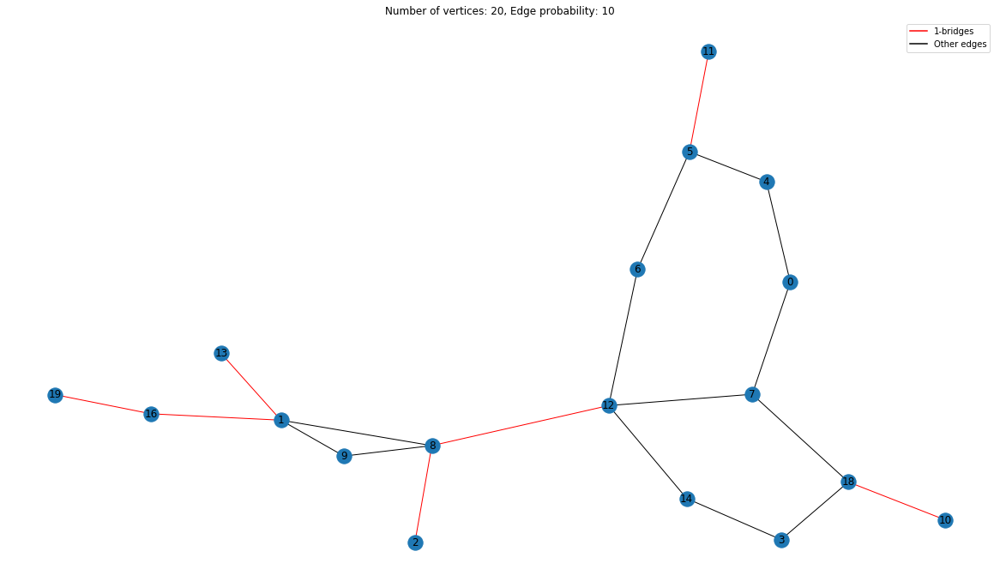

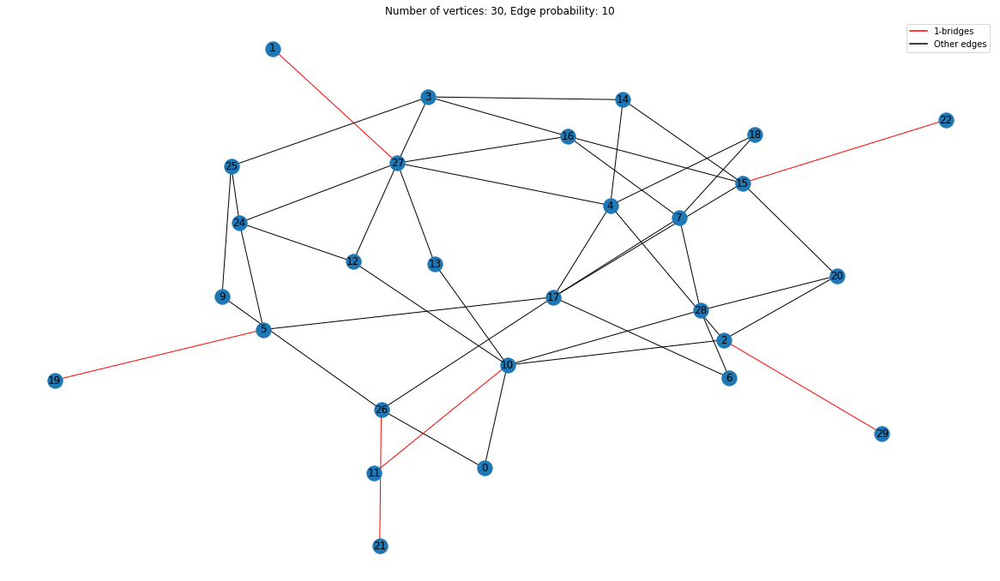

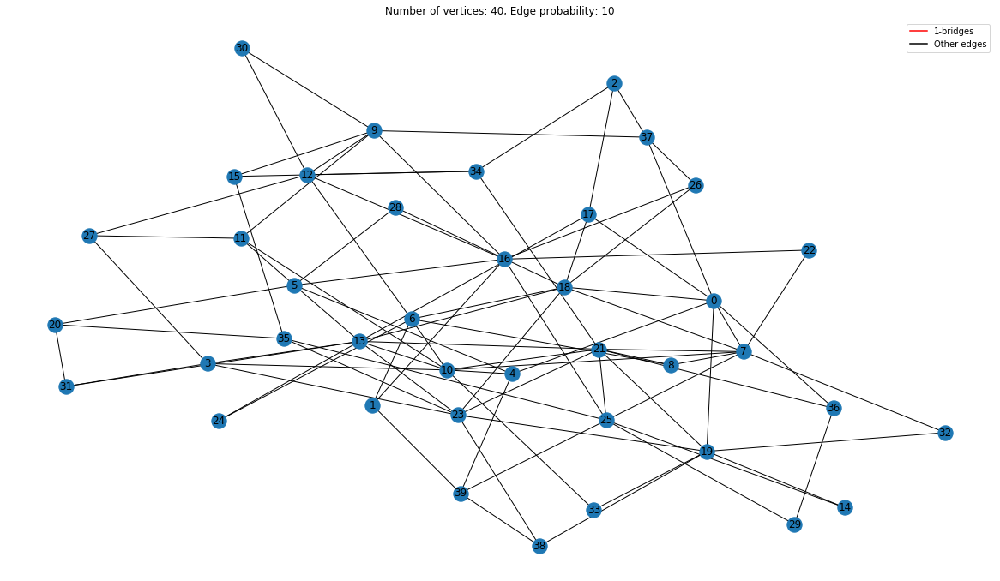

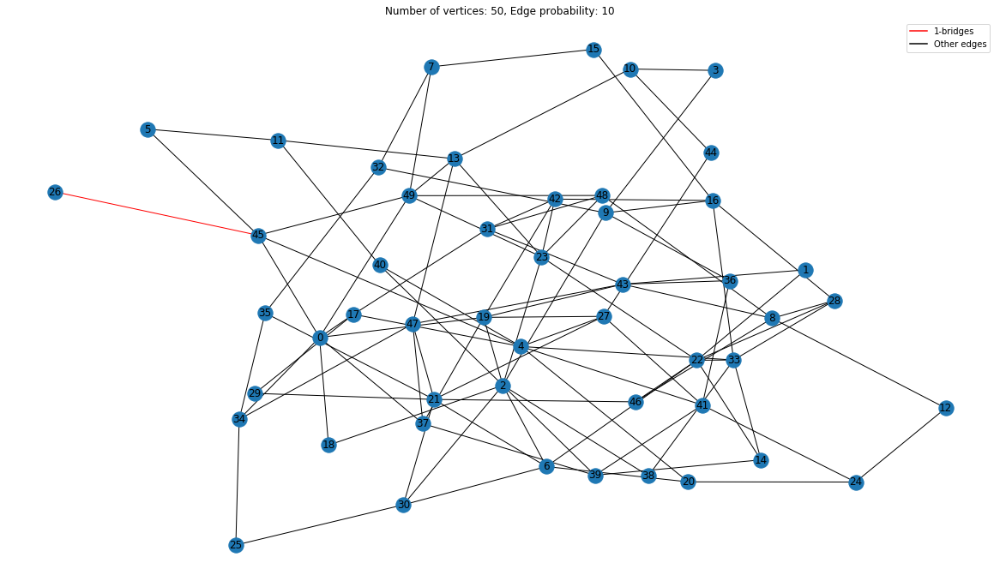

...

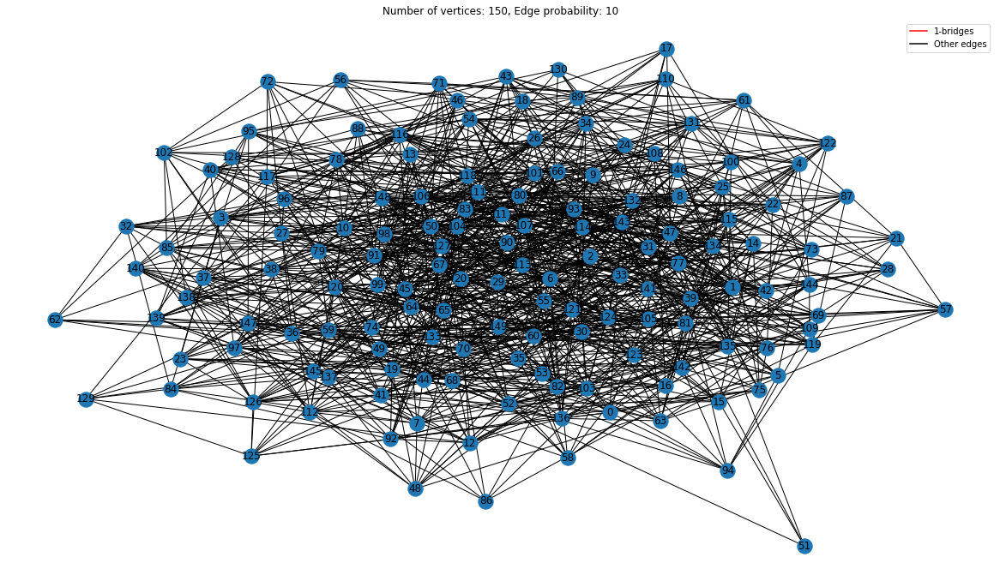

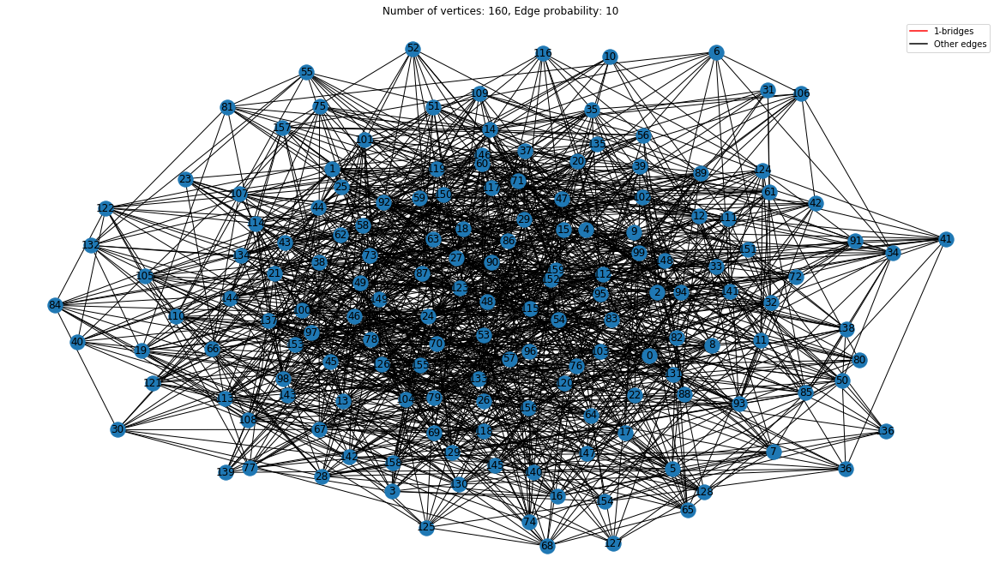

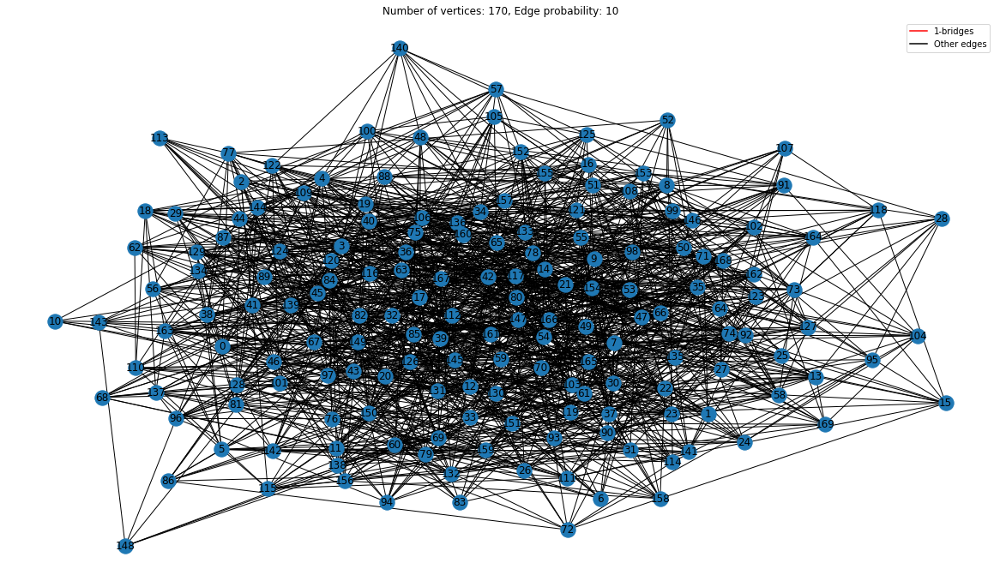

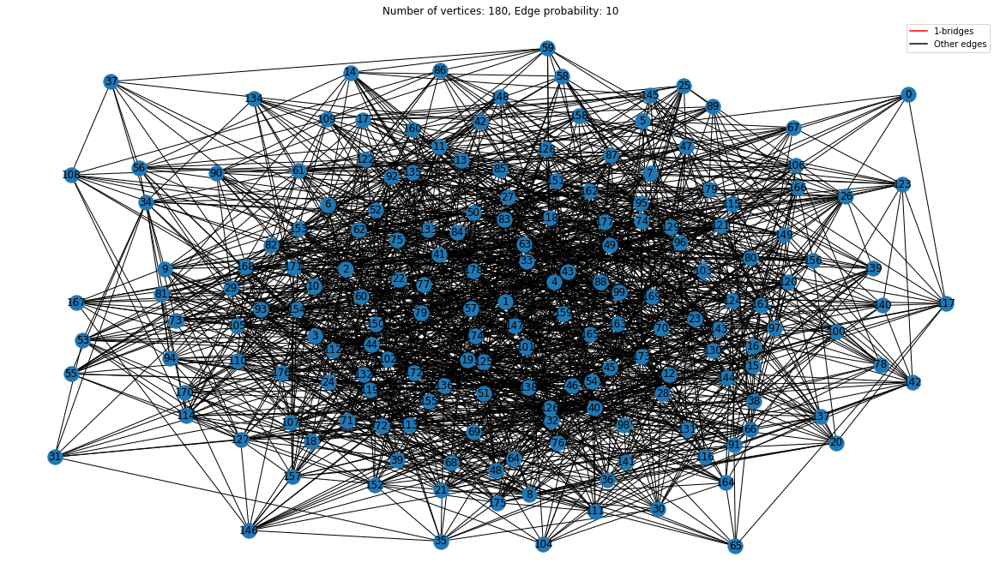

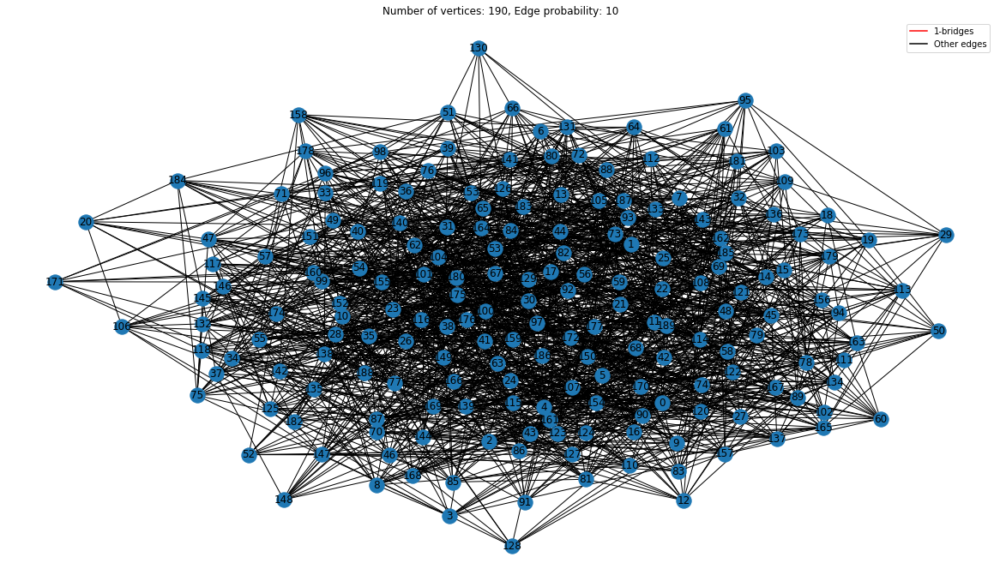

In [6]:
for i in range(10, 200, 10):
    draw_graph_from_file(i, 10)

# А на больших графах ?

Для этого, сгенерируем графа с вероятностью ребра 0.01%, так как в другом случае, граф получается слишком плотным и не содержит мостов

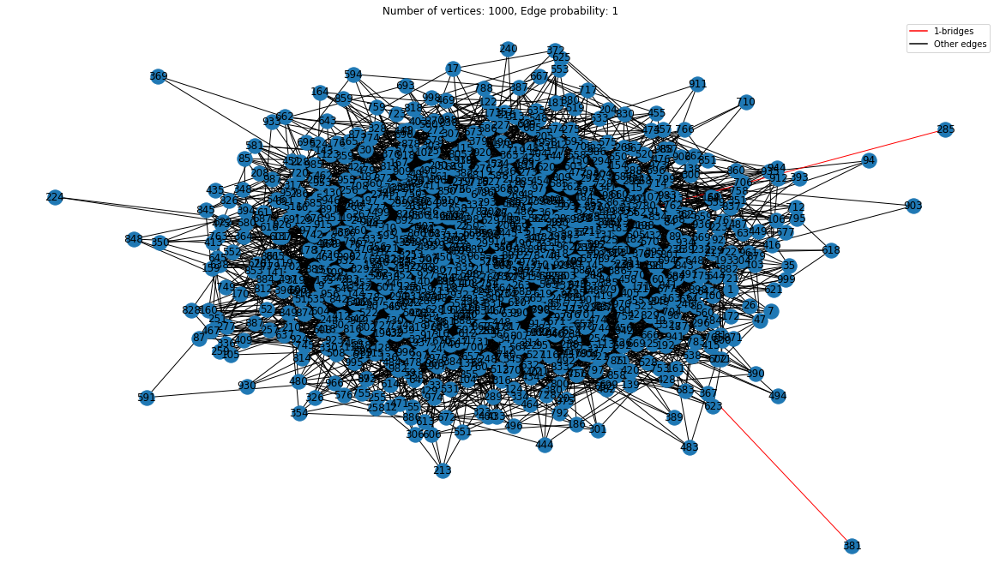

In [28]:
draw_graph_from_file(1000, 1, path='../graph/cmake-build-debug/')

# Визуализация 2-мостов на различных графах

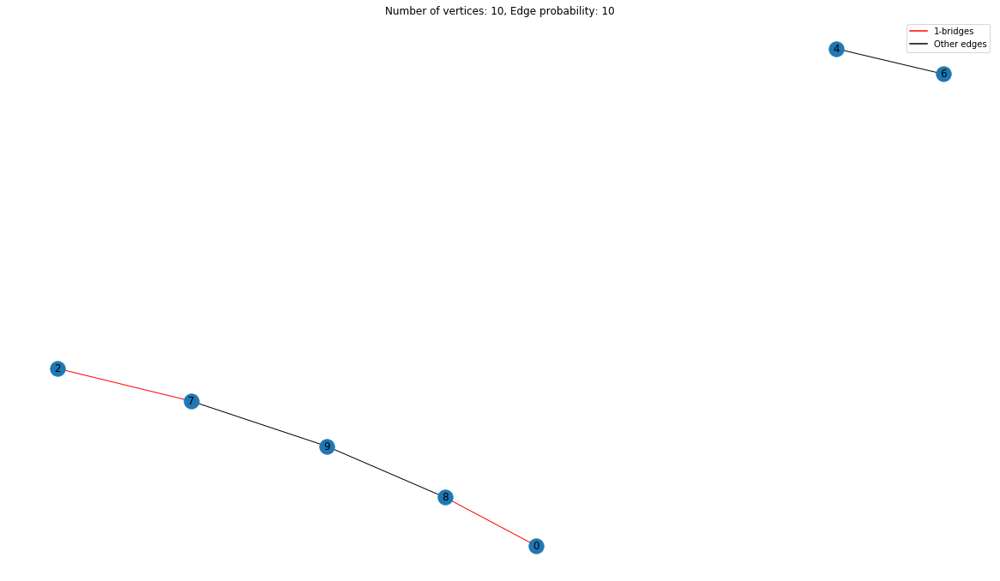

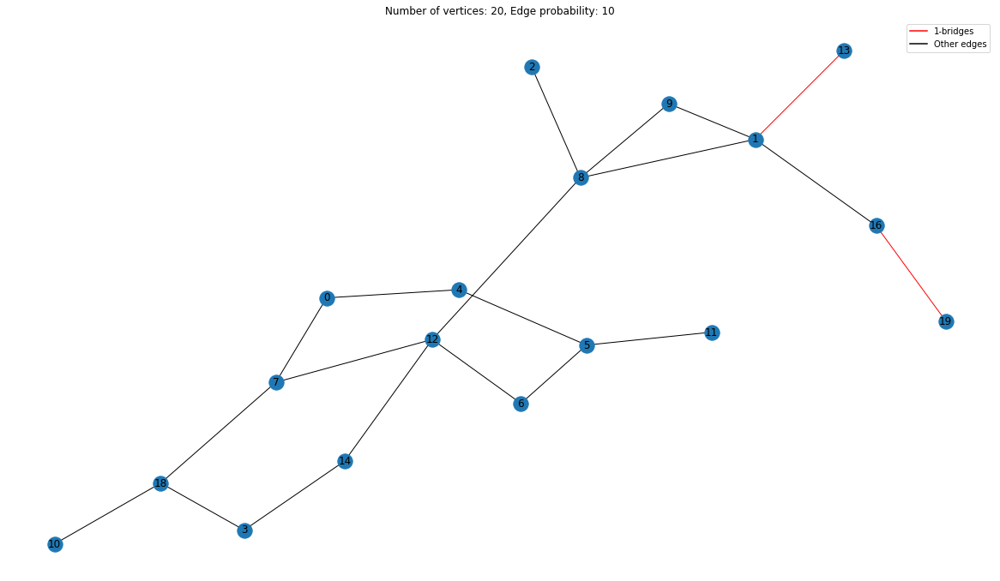

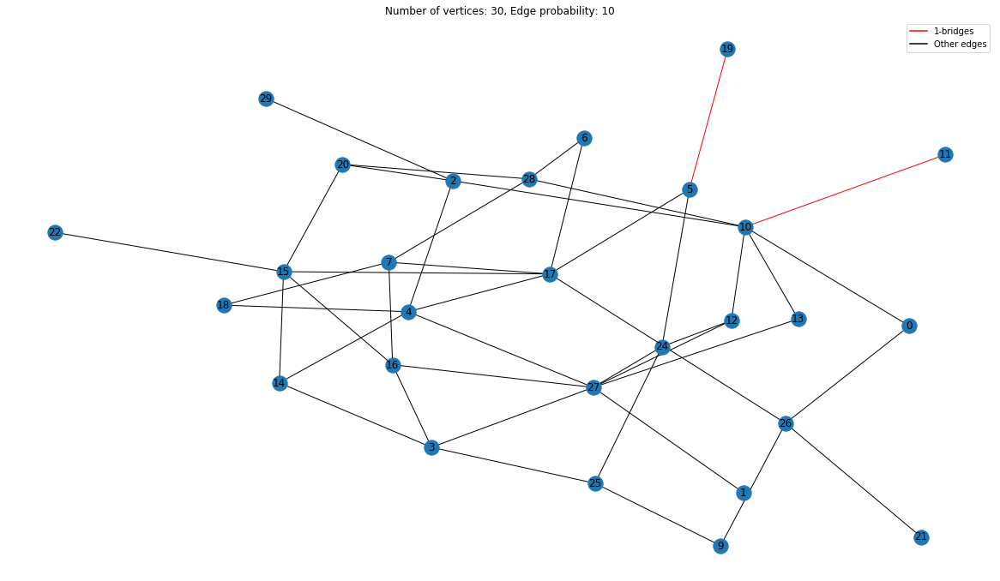

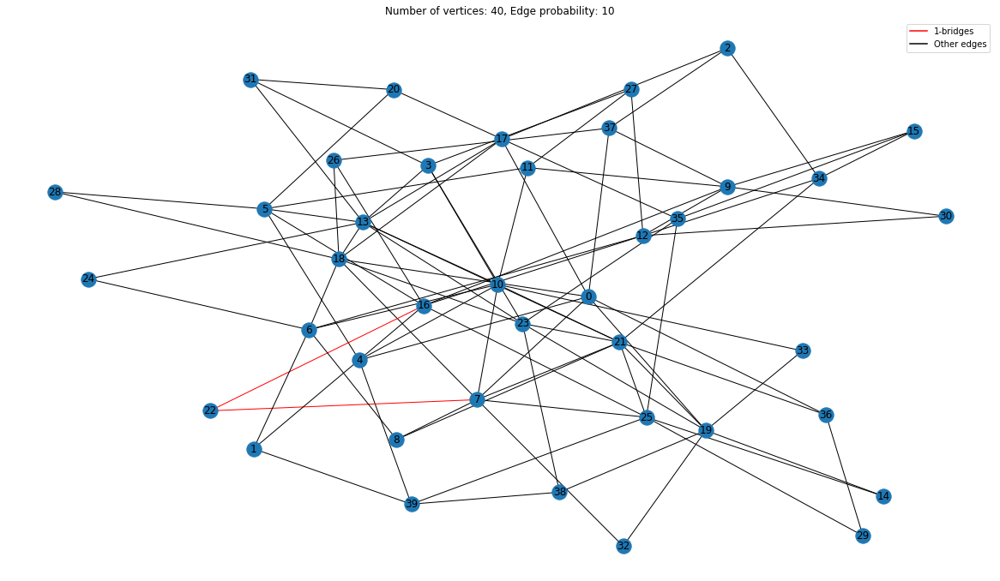

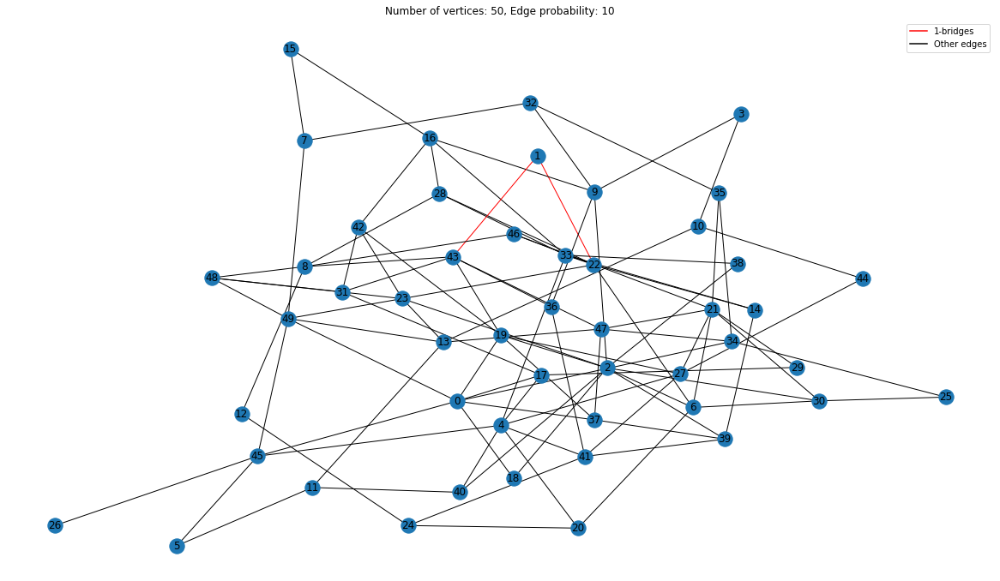

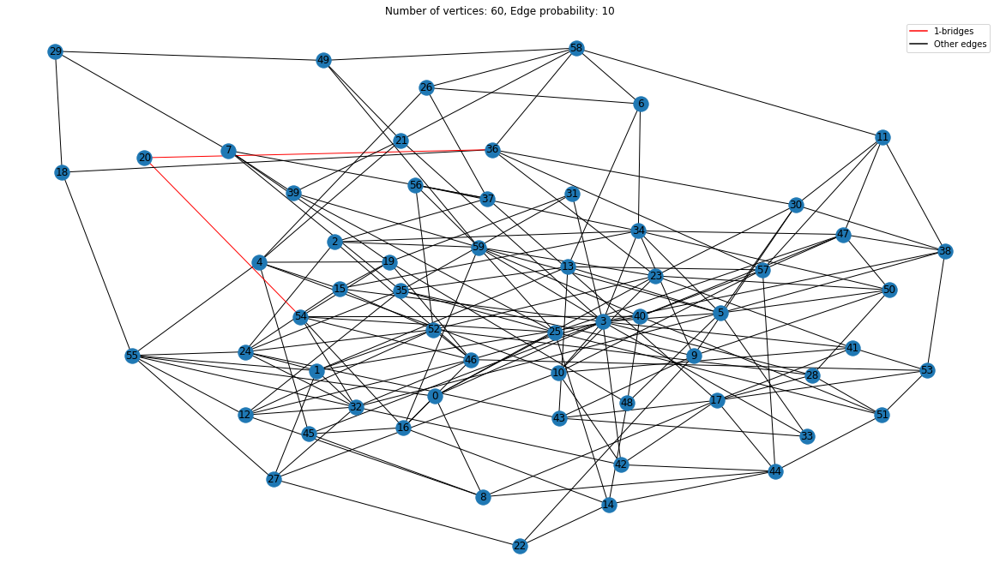

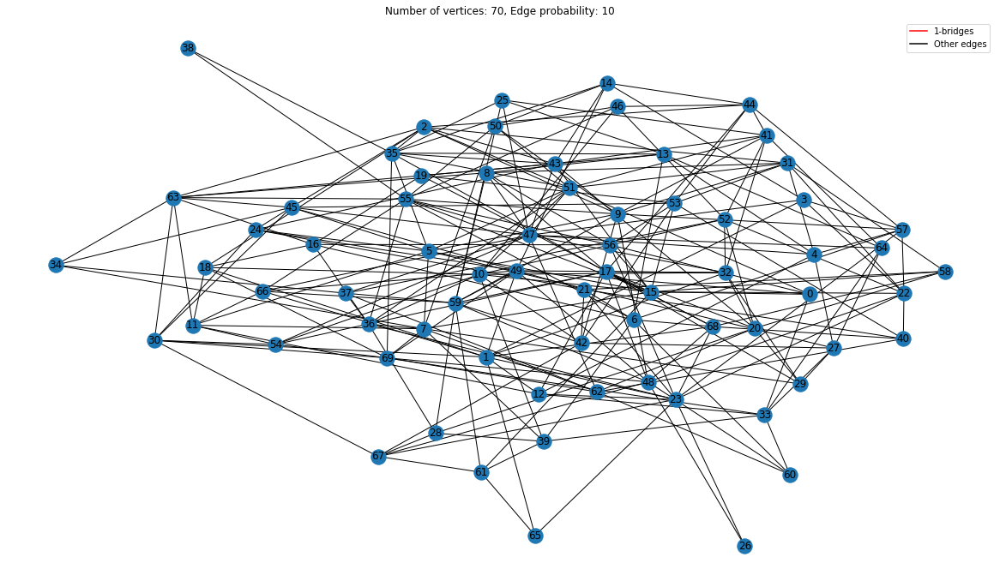

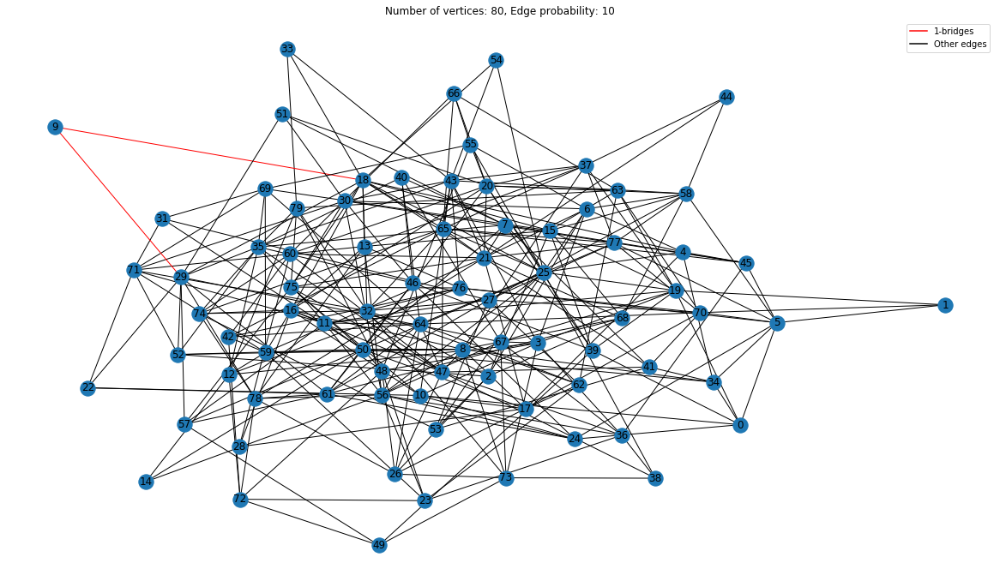

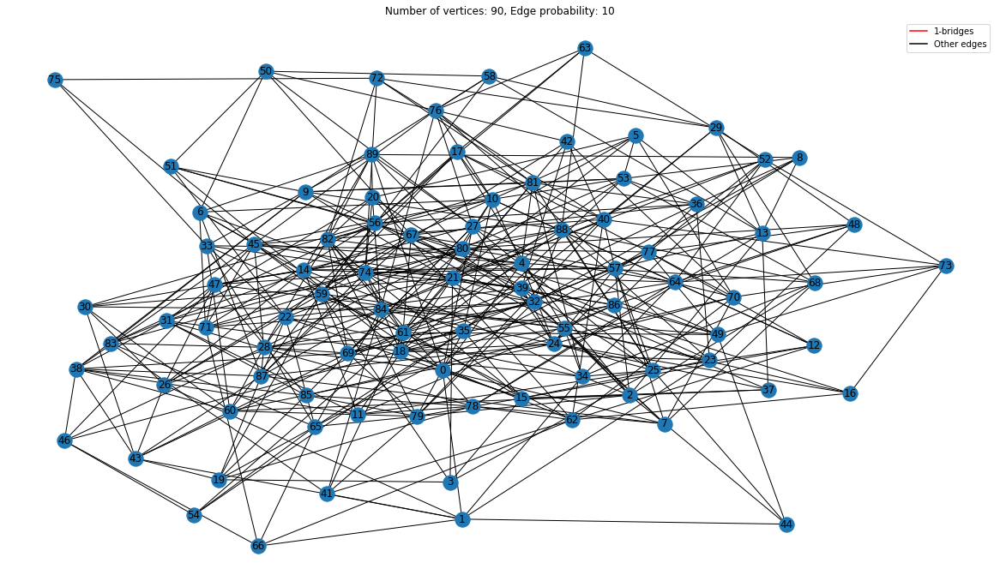

In [31]:
for i in range(10, 100, 10):
    draw_graph_from_file(i, 10, bridge_type='two')

## Время работы, используя различные подходы

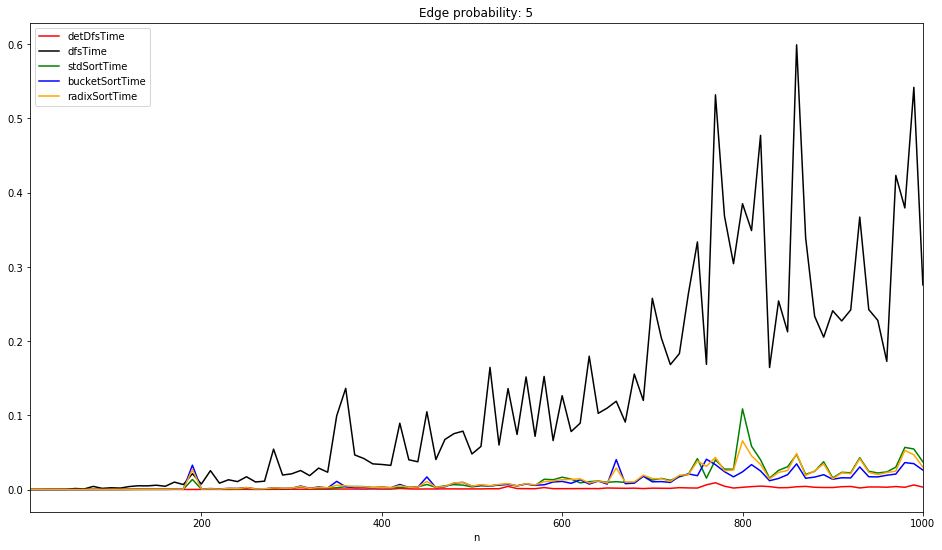

In [46]:
visualize(5)

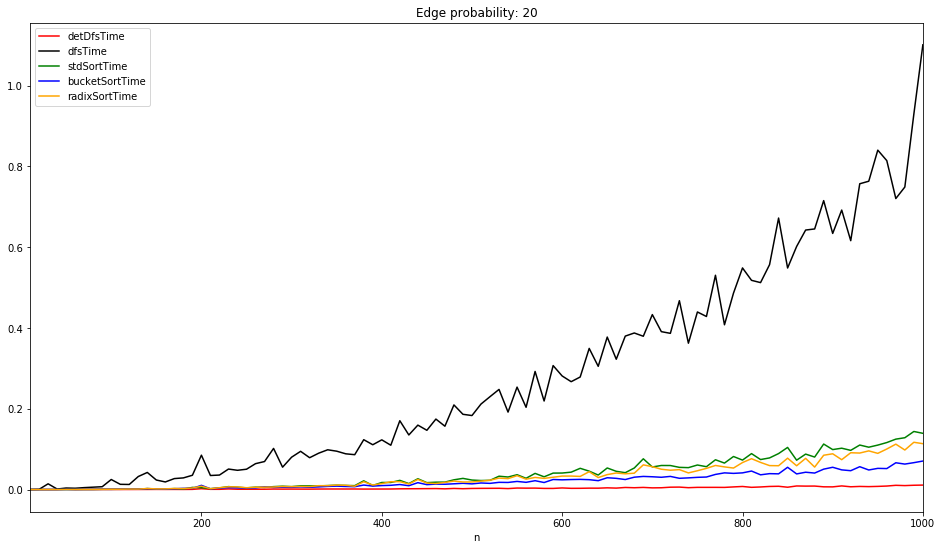

In [40]:
visualize(20)

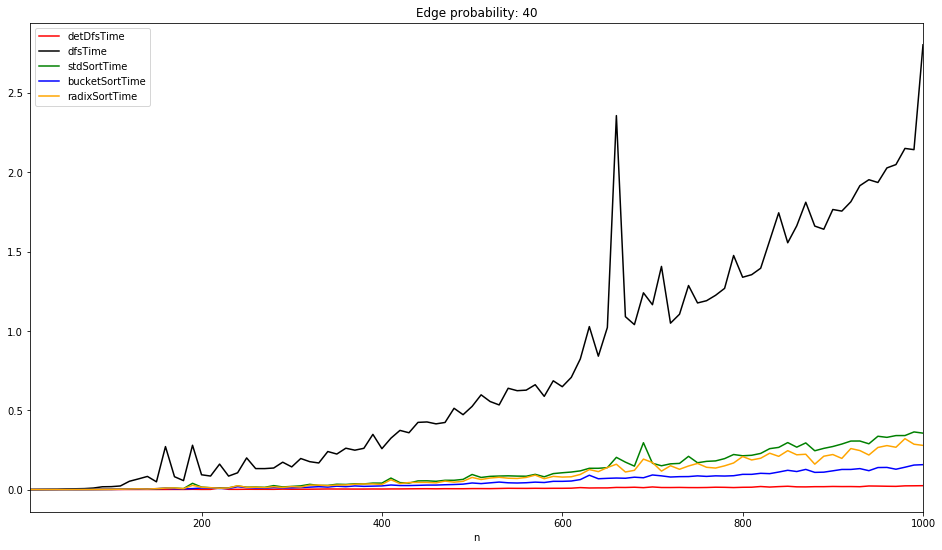

In [47]:
visualize(40)